In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

In [2]:
# wczytywanie danych
forestFires_df = pd.read_csv("forest_fires_dataset.csv")

In [3]:
# pierwsze spojrzenie na dane:
forestFires_df.head()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.0


In [4]:
# glebsze spojrzenie:
forestFires_df.info()

# widac, ze nie ma zadnych wartosci null. Jezeli bysmy zamierzali uzyc tych danych do uczenia maszynowego,
# przydaloby sie zamienic kolumny miesiac i dzien na wartosci liczbowe.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    float64
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(9), int64(2), object(2)
memory usage: 52.6+ KB


In [5]:
# glebsze spojrzenie 2.
forestFires_df.describe()

# dla wiekszosci kolumn dane sa dosyc zblizone do siebie.
# natomiast, dla DMC, DC oraz area, wariancja jest stosunkowo duza w porownaniu do wartosci sredniej, co moze oznaczac
# istnienie duzych outlierow.

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


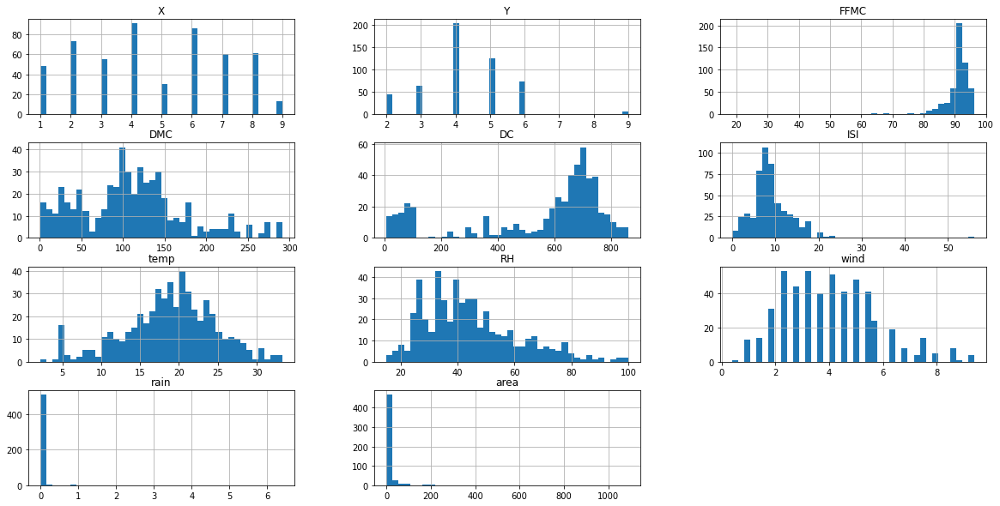

In [6]:
# obraz znaczy wiecej niz 1000 slow...
forestFires_df.hist(figsize=(20, 10), bins=40)
plt.show()

# w wiekszosci jest rozklad normalny (czasami skosny/przesuniety)
# w rain oraz area jest baaaaardzo duzo wartosci 0, mozliwe wiec, ze skala logarytmiczna bedzie dobra

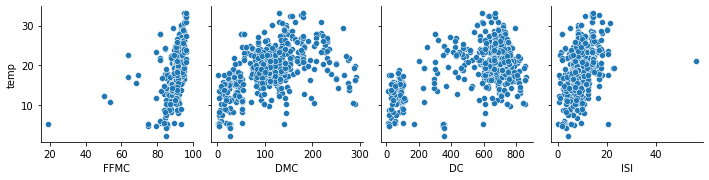

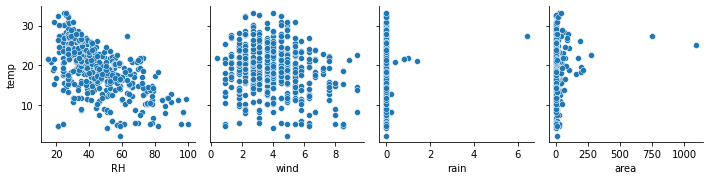

In [7]:
# a co z zaleznosciami pomiedzy zmiennymi?
# sprawdzmy temperature:
sns.pairplot(forestFires_df, y_vars="temp", x_vars=forestFires_df.columns.values[4:8])
sns.pairplot(forestFires_df, y_vars="temp", x_vars=forestFires_df.columns.values[9:13])
plt.show()

# widac korelacje temp-RH (relative humidity), co jest dosyc oczywiste

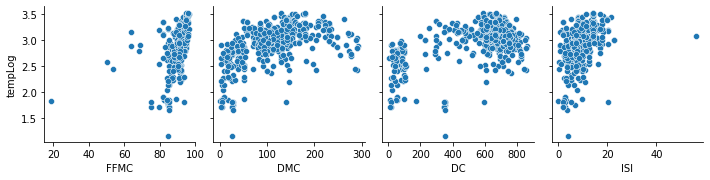

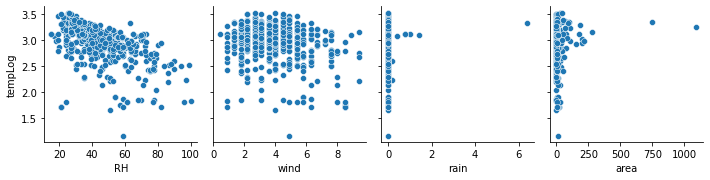

In [8]:
# a dla logarytmu:

forestFires_df["tempLog"] = np.log1p(forestFires_df["temp"])
sns.pairplot(forestFires_df, y_vars="tempLog", x_vars=forestFires_df.columns.values[4:8])
sns.pairplot(forestFires_df, y_vars="tempLog", x_vars=forestFires_df.columns.values[9:13])
plt.show()

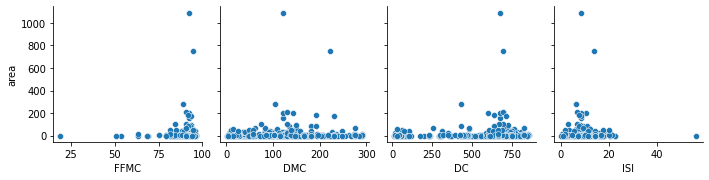

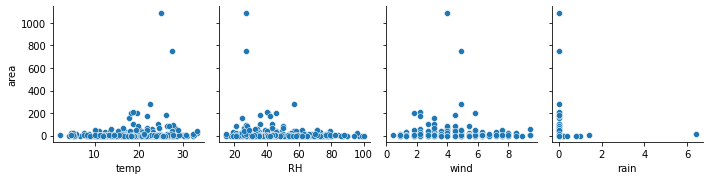

In [9]:
# sprawdzmy area:
sns.pairplot(forestFires_df, y_vars="area", x_vars=forestFires_df.columns.values[4:8])
sns.pairplot(forestFires_df, y_vars="area", x_vars=forestFires_df.columns.values[8:12])
plt.show()

# ???, moze dla log cos bedzie?

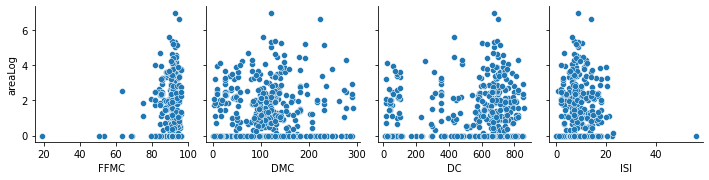

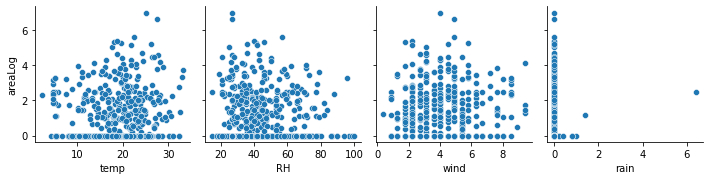

In [10]:
forestFires_df["areaLog"] = np.log1p(forestFires_df["area"])
sns.pairplot(forestFires_df, y_vars="areaLog", x_vars=forestFires_df.columns.values[4:8])
sns.pairplot(forestFires_df, y_vars="areaLog", x_vars=forestFires_df.columns.values[8:12])
plt.show()

# ?????

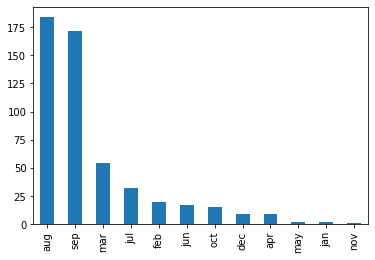

In [11]:
# w ktore miesiace jest najwiecej pozarow?
forestFires_df["month"].value_counts().plot(kind='bar')
plt.show()

# znaczna wiekszosc pozarow wystepuje w sierpniu i wrzesniu

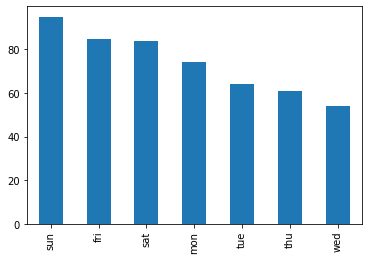

In [12]:
# w ktore dni tygodnia jest najwiecej pozarow?
forestFires_df["day"].value_counts().plot(kind='bar')
plt.show()

# czesciej pozary wystepuja w weekend

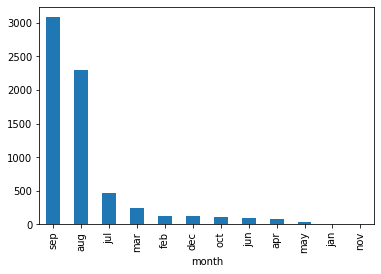

In [13]:
# ale sama ilosc pozarow nie oznacza jakosci, sprawdzmy jak sie maja pozary pod wzgledem sumy powierzchni od miesiaca
forestFires_df.groupby("month").area.sum().sort_values(ascending=False).plot(kind="bar")
plt.show()

# jest wiec jednak zamiana, i to w sierpniu plonie wieksza powierzchnia lasow niz we wrzesniu

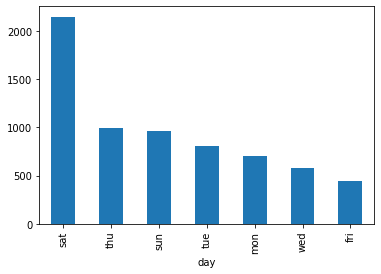

In [14]:
# a dla dni tygodni?
forestFires_df.groupby("day").area.sum().sort_values(ascending=False).plot(kind="bar")
plt.show()

# w piatek niby jest duzo pozarow, ale plonie jednak najmniejsza powierzchnia

In [15]:
# sprawdzmy jeszcze automatyczna analize danych:
from pandas_profiling import ProfileReport
ProfileReport(forestFires_df)

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
# jest tutaj duzo danych. Zwlaszcza spodobaly mi sie wizualizacje korelacji. Niestety, nie mozna zmieniac kolejnosci
# wyswietlania danych. Sprawia to problem, gdyz sa tutaj informacje o wszystkich danych, zamiast wybranych, co rozprasza.
# Rowniez, otrzymane raporty sa bardzo duze pod wzgledem szerokosci i wysokosci.